In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.io import loadmat

In [2]:
##all the sessions data of EEG
data1=loadmat("../../Database_PWelch_AvgTrials_MI_Baseline_RS1_19Subjects_EEG_Sess1.mat")
data2=loadmat("../../Database_PWelch_AvgTrials_MI_Baseline_RS1_19Subjects_EEG_Sess2.mat")
data3=loadmat("../../Database_PWelch_AvgTrials_MI_Baseline_RS1_19Subjects_EEG_Sess3.mat")
data4=loadmat("../../Database_PWelch_AvgTrials_MI_Baseline_RS1_19Subjects_EEG_Sess4.mat")

##all the sessions mi 
sess1_mi_avg=data1['Avg_MI_EEG_DK']
sess2_mi_avg=data2['Avg_MI_EEG_DK']
sess3_mi_avg=data3['Avg_MI_EEG_DK']
sess4_mi_avg=data4['Avg_MI_EEG_DK']

##all the sessions resting state
sess1_rest_avg=data1['Avg_RS1_EEG_DK']
sess2_rest_avg=data2['Avg_RS1_EEG_DK']
sess3_rest_avg=data3['Avg_RS1_EEG_DK']
sess4_rest_avg=data4['Avg_RS1_EEG_DK']

##all the sessions baseline
sess1_base_avg=data1['Avg_Baseline_EEG_DK']
sess2_base_avg=data2['Avg_Baseline_EEG_DK']
sess3_base_avg=data3['Avg_Baseline_EEG_DK']
sess4_base_avg=data4['Avg_Baseline_EEG_DK']

In [3]:
fvec=np.squeeze(data1["Freqs"])[3:30]

In [4]:
df=pd.read_excel('../ListROIs_DK.xlsx')
fvec=np.squeeze(data1["Freqs"])[3:30]

In [5]:
all_regions=[]
all_regions_idx=[]
for i,r in df.iterrows():
    all_regions_idx.append(i)
    all_regions.append(r['ROI'].strip("'"))

In [6]:
sess4_rest_avg.shape

(19, 68, 126)

In [7]:
for idx, region in enumerate(all_regions):
    print(idx, region)

0 bankssts L
1 bankssts R
2 caudalanteriorcingulate L
3 caudalanteriorcingulate R
4 caudalmiddlefrontal L
5 caudalmiddlefrontal R
6 cuneus L
7 cuneus R
8 entorhinal L
9 entorhinal R
10 frontalpole L
11 frontalpole R
12 fusiform L
13 fusiform R
14 inferiorparietal L
15 inferiorparietal R
16 inferiortemporal L
17 inferiortemporal R
18 insula L
19 insula R
20 isthmuscingulate L
21 isthmuscingulate R
22 lateraloccipital L
23 lateraloccipital R
24 lateralorbitofrontal L
25 lateralorbitofrontal R
26 lingual L
27 lingual R
28 medialorbitofrontal L
29 medialorbitofrontal R
30 middletemporal L
31 middletemporal R
32 paracentral L
33 paracentral R
34 parahippocampal L
35 parahippocampal R
36 parsopercularis L
37 parsopercularis R
38 parsorbitalis L
39 parsorbitalis R
40 parstriangularis L
41 parstriangularis R
42 pericalcarine L
43 pericalcarine R
44 postcentral L
45 postcentral R
46 posteriorcingulate L
47 posteriorcingulate R
48 precentral L
49 precentral R
50 precuneus L
51 precuneus R
52 ros

### Plotting spectra

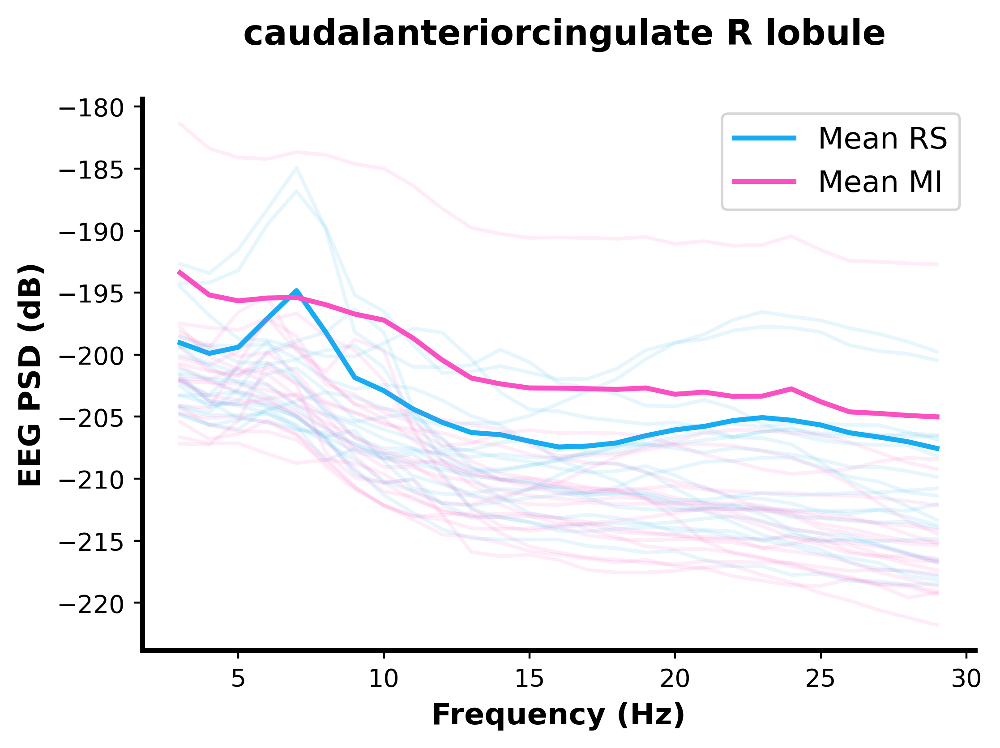

In [31]:
#plotting mean spectra
col_rs = "#16ACF2" 
col_mi = "#FA50C4" 

fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=400)

region=all_regions[3]
#individual spectra
for i in range(19):
    ax.plot(fvec, 10*np.log10(sess4_rest_avg[i, 3, 3:30]), color=col_rs, alpha=0.1)
#mean spectrum
spectra_eeg_rs1 = 10*np.log10(np.mean(sess4_rest_avg[:, 3, 3:30], axis=0))
ax.plot(fvec, spectra_eeg_rs1, color=col_rs, label='Mean RS', linewidth=2)

# individual spectra
for i in range(19):
    ax.plot(fvec, 10*np.log10(sess4_mi_avg[i, 3, 3:30]), color=col_mi, alpha=0.1)
#mean spectrum 
spectra_eeg_mi = 10*np.log10(np.mean(sess4_mi_avg[:, 3, 3:30], axis=0))
ax.plot(fvec, spectra_eeg_mi, color=col_mi, label='Mean MI', linewidth=2)

ax.set_title(f' {region} lobule\n', fontweight='bold', fontsize=14)
ax.set_xlabel('Frequency (Hz)',fontweight='bold', fontsize=12)
ax.set_ylabel('EEG PSD (dB)',fontweight='bold', fontsize=12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_linewidth(2)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_linewidth(2)
ax.spines['left'].set_color('black')
ax.legend(fontsize=12)
ax.grid(False)

plt.show()

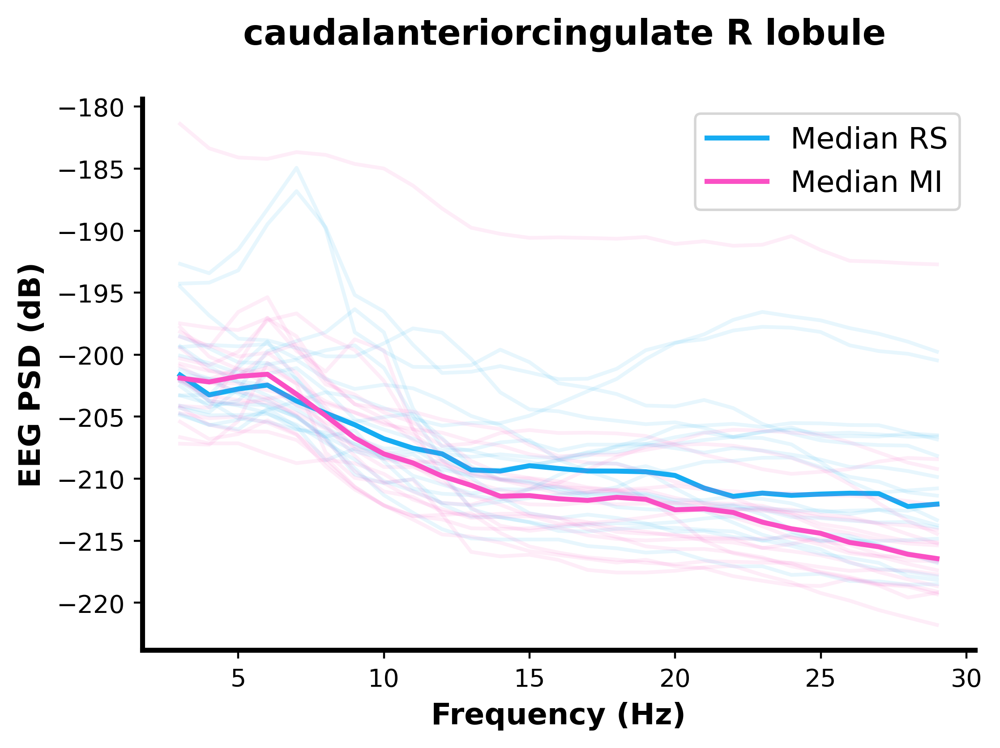

In [32]:
#plotting median spectra
col_rs = "#16ACF2" 
col_mi = "#FA50C4" 

fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=400)

region=all_regions[3]
#individual spectra
for i in range(19):
    ax.plot(fvec, 10*np.log10(sess4_rest_avg[i, 3, 3:30]), color=col_rs, alpha=0.1)
#median spectrum
spectra_eeg_rs1 = 10*np.log10(np.median(sess4_rest_avg[:, 3, 3:30], axis=0))
ax.plot(fvec, spectra_eeg_rs1, color=col_rs, label='Median RS', linewidth=2)

#individual spectra
for i in range(19):
    ax.plot(fvec, 10*np.log10(sess4_mi_avg[i, 3, 3:30]), color=col_mi, alpha=0.1)
#median spectrum 
spectra_eeg_mi = 10*np.log10(np.median(sess4_mi_avg[:, 3, 3:30], axis=0))
ax.plot(fvec, spectra_eeg_mi, color=col_mi, label='Median MI', linewidth=2)

ax.set_title(f' {region} lobule\n', fontweight='bold', fontsize=14)
ax.set_xlabel('Frequency (Hz)',fontweight='bold', fontsize=12)
ax.set_ylabel('EEG PSD (dB)',fontweight='bold', fontsize=12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_linewidth(2)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_linewidth(2)
ax.spines['left'].set_color('black')
ax.legend(fontsize=12)
ax.grid(False)

plt.show()

In [12]:
sess4_rest_avg.shape

(19, 68, 126)

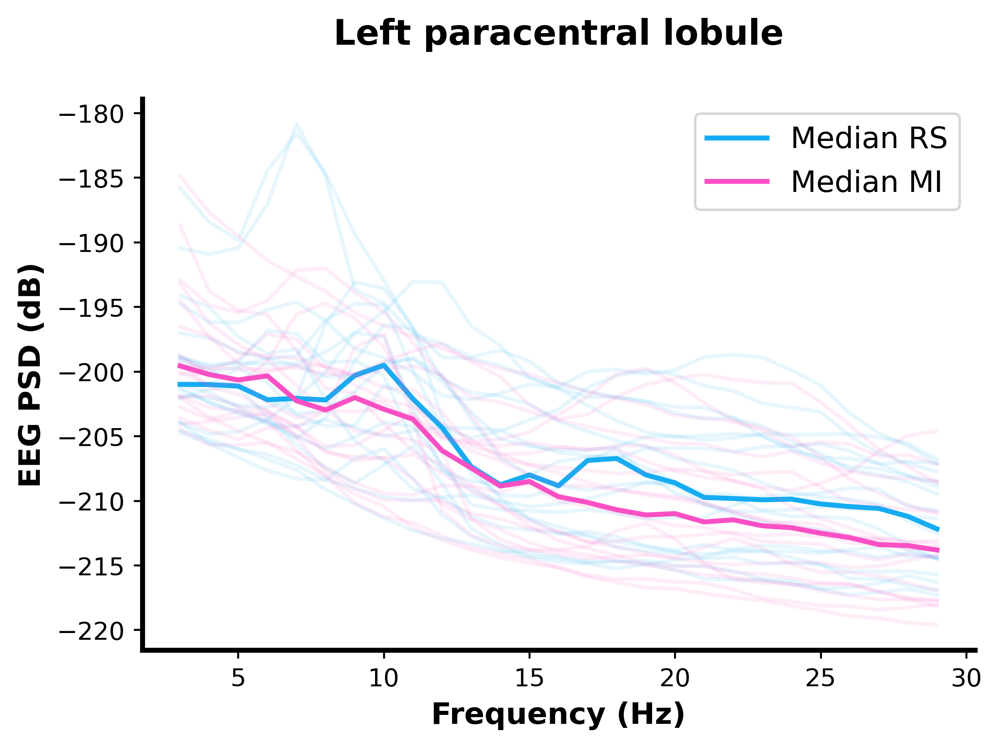

In [33]:
#plotting median spectra-LEFT PARACENTRAL
col_rs = "#16ACF2" 
col_mi = "#FA50C4" 

fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=400)

region=all_regions[32]
#individual spectra
for i in range(19):
    ax.plot(fvec, 10*np.log10(sess4_rest_avg[i, 32, 3:30]), color=col_rs, alpha=0.1)
#median spectrum
spectra_eeg_rs1 = 10*np.log10(np.median(sess4_rest_avg[:, 32, 3:30], axis=0))
ax.plot(fvec, spectra_eeg_rs1, color=col_rs, label='Median RS', linewidth=2)

#individual spectra
for i in range(19):
    ax.plot(fvec, 10*np.log10(sess4_mi_avg[i, 32, 3:30]), color=col_mi, alpha=0.1)
#median spectrum 
spectra_eeg_mi = 10*np.log10(np.median(sess4_mi_avg[:, 32, 3:30], axis=0))
ax.plot(fvec, spectra_eeg_mi, color=col_mi, label='Median MI', linewidth=2)

ax.set_title(f'Left {region[:-2]} lobule\n', fontweight='bold', fontsize=14)
ax.set_xlabel('Frequency (Hz)',fontweight='bold', fontsize=12)
ax.set_ylabel('EEG PSD (dB)',fontweight='bold', fontsize=12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_linewidth(2)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_linewidth(2)
ax.spines['left'].set_color('black')
ax.legend(fontsize=12)
ax.grid(False)

plt.show()

In [34]:
# #Plotting all regions individually
# col_rs = "#16ACF2" 
# col_mi = "#FA50C4" 

# for region in range(68):
#     fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=400)
#     #individual spectra
#     for i in range(19):
#         ax.plot(fvec, 10*np.log10(sess4_rest_avg[i, region, 3:30]), color=col_rs, alpha=0.1)
#     #median spectrum
#     spectra_eeg_rs1 = 10*np.log10(np.median((sess4_rest_avg[:, region, 3:30]), axis=0))
#     ax.plot(fvec, spectra_eeg_rs1, color=col_rs, label='RS', linewidth=2)

#     #individual spectra
#     for i in range(19):
#         ax.plot(fvec, 10*np.log10(sess4_mi_avg[i, region, 3:30]), color=col_mi, alpha=0.1)
#     #median spectrum 
#     spectra_eeg_mi = 10*np.log10(np.median((sess4_mi_avg[:, region, 3:30]), axis=0))
#     ax.plot(fvec, spectra_eeg_mi, color=col_mi, label='MI', linewidth=2)

#     ax.set_title(f'{all_regions[region]}', fontsize=14)
#     ax.set_xlabel('Frequency (Hz)', fontsize=12)
#     ax.set_ylabel('EEG PSD (dB)', fontsize=12)
#     ax.legend(fontsize=12)
#     ax.grid(False)

#     plt.show()


In [ ]:
#To plot some regions in subplots
##change median and median accordingly
col_rs = "#16ACF2" 
col_mi = "#FA50C4" 

def find_spectra(data, region_idx):
    median_spectra=[]
    ind_spectra=[]
    for idx in region_idx:
        sub_data=data[:,idx, 3:30] 
        median_spectrum=np.median(sub_data, axis=0)  
        ind_spectrum=sub_data
        median_spectra.append(median_spectrum)
        ind_spectra.append(ind_spectrum)
    return np.array(10*np.log10(median_spectra)), np.array(10*np.log10(ind_spectra)) ##in dB scale

def plot_all_exp_base(freq, session, median_mi, individual_mi, median_rs, individual_rs, region_idx, region_names):
    tot_regions=len(region_idx)
    cols=3 
    rows=(tot_regions+cols-1)//cols
    
    fig, axes=plt.subplots(rows, cols, figsize=(15, 3*rows), dpi=400)
    axes=axes.flatten()  
    for i, idx in enumerate(region_names):
        for spectrum in individual_mi[i]:
            axes[i].plot(freq, spectrum, color=col_mi, alpha=0.1, zorder=1)
        axes[i].plot(freq, median_mi[i], label=f'{session} median MI', color=col_mi, linewidth=2.5, zorder=2)

        for spectrum in individual_rs[i]:
            axes[i].plot(freq, spectrum, color=col_rs, alpha=0.1, zorder=1)
        axes[i].plot(freq, median_rs[i], label=f'{session} median RS', color=col_rs, linewidth=2.5, zorder=2)
        
        axes[i].set_title(f'{idx}')
        axes[i].legend()
        axes[i].grid(False)
    
    for ax in axes.flat:
        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('EEG PSD (dB)')
    
    plt.tight_layout()
    plt.show()

In [28]:
##TARGET INDICES
indices=[32, 33, 20, 42, 50, 51, 58, 6, 7]
region_name=[]
for idx in indices:
    region_name.append(all_regions[idx])

print(region_name)

['paracentral L', 'paracentral R', 'isthmuscingulate L', 'pericalcarine L', 'precuneus L', 'precuneus R', 'superiorparietal L', 'cuneus L', 'cuneus R']


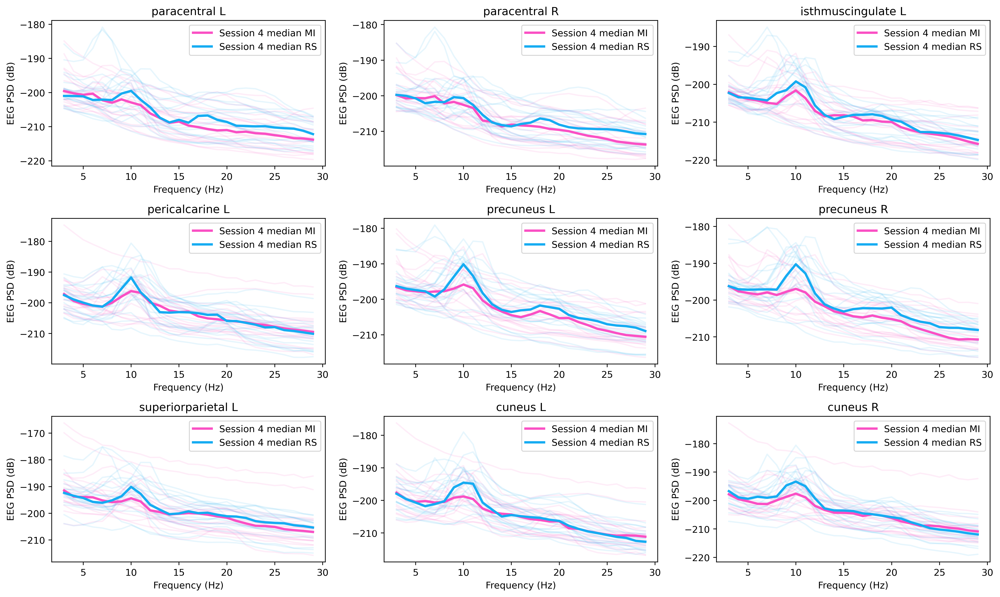

In [29]:
##TARGET Index
mean_mi, individual_mi=find_spectra(sess4_mi_avg, indices)
mean_rs, individual_rs=find_spectra(sess4_rest_avg, indices)
# mean_bs, ind_bs=find_spectra(sess4_base_avg, indices)

# plot_all(fvec,'Sess4', mean_mi, individual_mi, mean_rs, individual_rs, mean_bs, ind_bs, indices, significant_reg_tau_e)
plot_all_exp_base(fvec, 'Session 4' , mean_mi, individual_mi, mean_rs, individual_rs, indices, region_name)

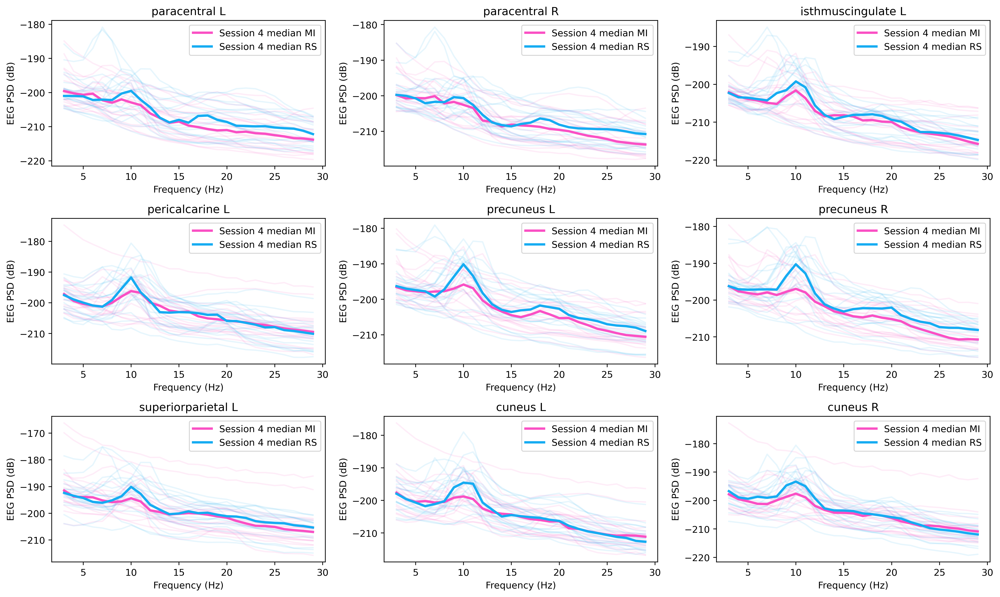

In [35]:
##TARGET Index
##Anamoly with mean spectra
mean_mi, individual_mi=find_spectra(sess4_mi_avg, indices)
mean_rs, individual_rs=find_spectra(sess4_rest_avg, indices)
# mean_bs, ind_bs=find_spectra(sess4_base_avg, indices)

# plot_all(fvec,'Sess4', mean_mi, individual_mi, mean_rs, individual_rs, mean_bs, ind_bs, indices, significant_reg_tau_e)
plot_all_exp_base(fvec, 'Session 4' , mean_mi, individual_mi, mean_rs, individual_rs, indices, region_name)